In [1]:
import tkinter as tk
import tkinter.ttk
from tkinter import filedialog
from PIL import ImageTk, Image
import numpy as np
import cv2
import skimage as ski
from skimage.color import rgb2gray
from sklearn.decomposition import PCA

import matplotlib.pyplot as plt
import pandas as pd
import tables as tb
import os



(240, 240, 4)
one image [0. 0. 0. 0.]


C:\Users\user\AppData\Local\Temp\ipykernel_10052\2602851716.py:30: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, ax = plt.subplots(1,3, figsize=(20,2))#no_slices, 4,


<Figure size 640x480 with 0 Axes>

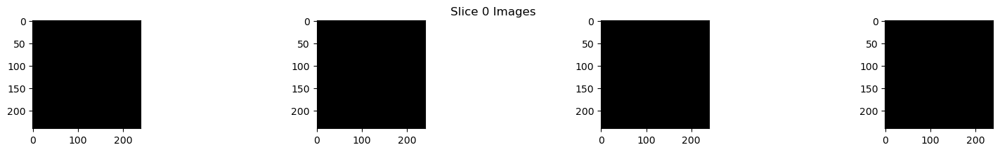

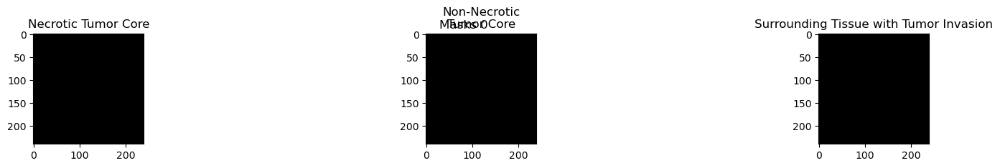

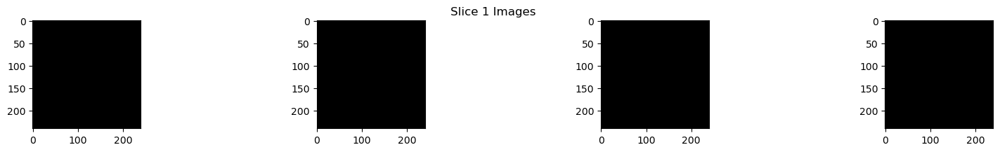

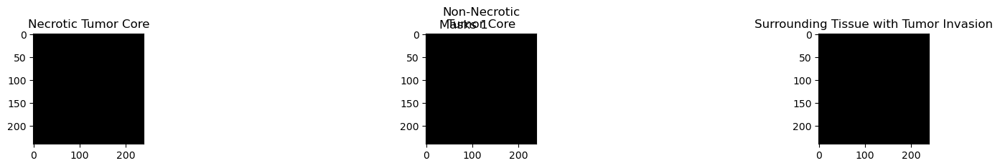

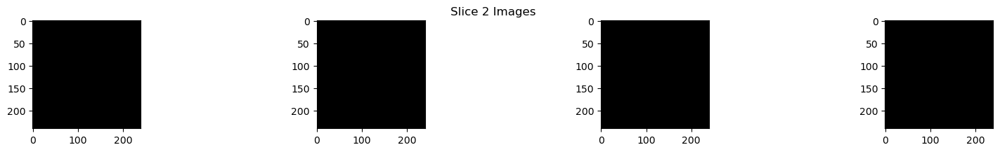

...

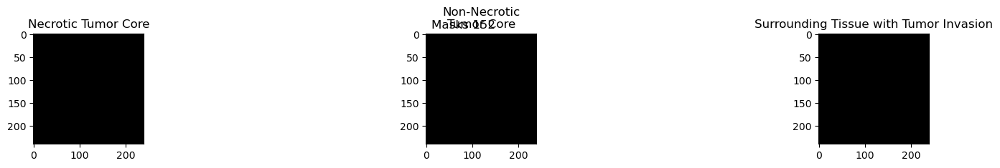

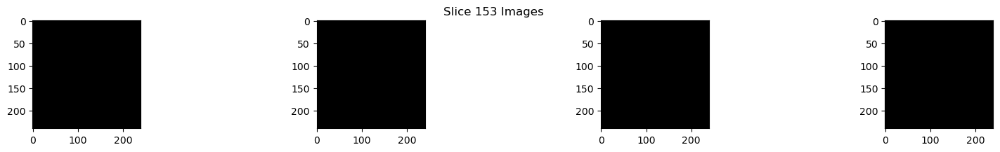

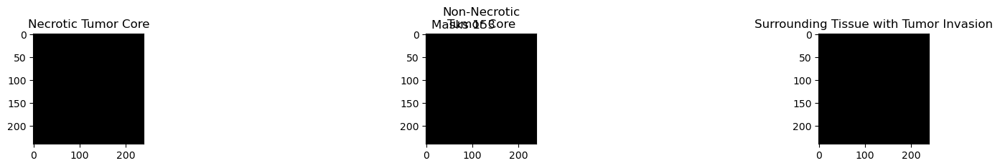

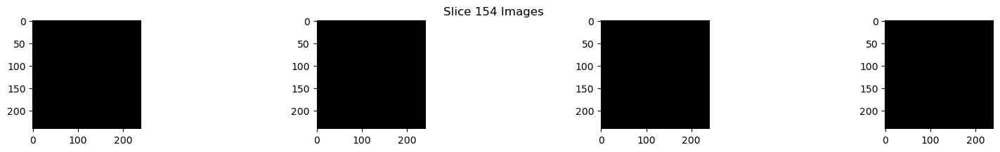

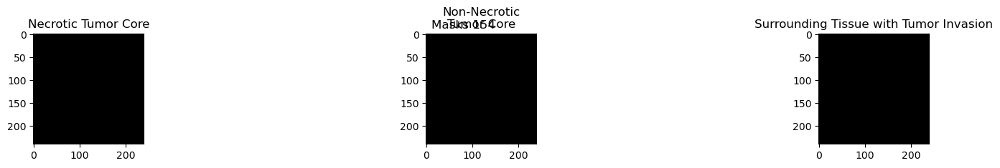

In [2]:
no_slices = 155


glioma_masks =  tb.open_file(r"C:\Users\user\Documents\UWA\Honours in Computer Science and Software Engineering\CITS4402 - Computer Vision\Project\archive\BraTS2020_training_data\content\data\volume_1_slice_0.h5", mode="r").root.mask.read()
glioma_images =  tb.open_file(r"C:\Users\user\Documents\UWA\Honours in Computer Science and Software Engineering\CITS4402 - Computer Vision\Project\archive\BraTS2020_training_data\content\data\volume_1_slice_0.h5", mode="r").root.image.read()

print(glioma_images.shape)
glioma_slices_masks= glioma_masks[np.newaxis,:]
glioma_slices_images= glioma_images[np.newaxis,:]

for slice in range(1,no_slices):
    
    next_glioma_mask =  tb.open_file(r"C:\Users\user\Documents\UWA\Honours in Computer Science and Software Engineering\CITS4402 - Computer Vision\Project\archive\BraTS2020_training_data\content\data\volume_1_slice_"+str(slice)+".h5", mode="r").root.mask.read()
    next_glioma_image =  tb.open_file(r"C:\Users\user\Documents\UWA\Honours in Computer Science and Software Engineering\CITS4402 - Computer Vision\Project\archive\BraTS2020_training_data\content\data\volume_1_slice_"+str(slice)+".h5", mode="r").root.image.read()
    
    glioma_slices_masks = np.vstack((glioma_slices_masks,next_glioma_mask[np.newaxis,:]))
    glioma_slices_images = np.vstack((glioma_slices_images,next_glioma_image[np.newaxis,:]))

print("one image",glioma_images[0,0])
#fig, ax = plt.subplots(10,4, figsize=(20,2))#no_slices, 4,
#print("image shape",glioma_slices_images[slice,:,:,image].shape)
mask_titles=["Necrotic Tumor Core","Non-Necrotic\nTumor Core","Surrounding Tissue with Tumor Invasion"]

plt.subplots_adjust(wspace=0.5, hspace=0.2)
for slice in range(no_slices): #glioma_slices_images.shape[0]
    fig, ax = plt.subplots(1,4, figsize=(20,2))#no_slices, 4,
    fig.suptitle("Slice "+ str(slice) + " Images " )
    for image in range(glioma_slices_images.shape[3]):
        ax[image].imshow(glioma_slices_images[slice,:,:,image],cmap="gray")
    fig, ax = plt.subplots(1,3, figsize=(20,2))#no_slices, 4,
    fig.suptitle("Masks " + str(slice))
    for image in range(glioma_slices_masks.shape[3]):
        ax[image].set_title(mask_titles[image])
        ax[image].imshow(glioma_slices_masks[slice,:,:,image],cmap="gray")
    
plt.show()

In [3]:
#print("image shape",glioma_slices_images[slice,:,:,image].shape)
#print("image shape",type(glioma_slices_images[slice,:,:,image]))
#print("image shape",repr(glioma_slices_images[slice,:,:,image]))

Masks are non overlapping and numpy arrays therefore just add together elementwise. No dic=vision by three or other manipulation

In [4]:
#print(glioma_slices_masks[58,:,:,2])

In [5]:
# Funciton to create a merged mask from the list of masks uploaded from the dataset
# returns the marged mask
#np.set_printoptions(threshold=np.inf)
def merge_masks2(mask_array):

    # merge overlapping masks by addition
    merge_one = mask_array[:,:,0] + mask_array[:,:,1] + mask_array[:,:,2]
   
    return merge_one


In [6]:
volume_count = 0
slices_count= []

for slice in range(no_slices):
    slice_count = 0
    
    
    merged_mask = merge_masks2(glioma_slices_masks[slice,:,:,:])
    
    for x in range(merged_mask.shape[0]):
        for y in range(merged_mask.shape[1]):
            #print("made it to the second loop")
            if merged_mask[x,y] == 1:
                
                slice_count +=1
    
    #print("made it here")
    slices_count.append(slice_count)
    
    volume_count += slice_count
    
    #plt.imshow(merged_mask)
    #plt.title("Slice "+str(slice) + "\n pixel count " + str(slice_count))
    #plt.show()




            

In [7]:
print(len(slices_count))
print("Slice\tPixel Count")
for slice in range(len(slices_count)):
    print(f"{slice}\t{slices_count[slice]}")

max_vol = max(slices_count)
print(f"Maximum Voxel in Volume: {max_vol}")

155
Slice	Pixel Count
0	0
1	0
2	0
3	0
4	0
5	0
6	0
7	0
8	0
9	0
10	0
11	0
12	0
13	0
14	0
15	0
16	0
17	0
18	0
19	0
20	0
21	0
22	0
23	0
24	0
25	0
26	0
27	0
28	0
29	0
30	4
31	83
32	201
33	262
34	301
35	347
36	439
37	526
38	588
39	633
40	651
41	747
42	947
43	1025
44	1121
45	1154
46	1202
47	1357
48	1649
49	1974
50	2175
51	2240
52	2328
53	2545
54	2859
55	2992
56	3070
57	3138
58	3272
59	3644
60	3906
61	4068
62	4186
63	4280
64	4588
65	4845
66	5030
67	5048
68	5040
69	5014
70	5017
71	4921
72	4860
73	4761
74	4584
75	4552
76	4500
77	4428
78	4453
79	4265
80	4217
81	4209
82	4175
83	4135
84	4183
85	4077
86	3832
87	3797
88	3765
89	3752
90	3764
91	3535
92	3257
93	3164
94	3008
95	2772
96	2290
97	1815
98	1673
99	1598
100	1508
101	1397
102	1211
103	1055
104	966
105	867
106	780
107	647
108	418
109	141
110	89
111	48
112	14
113	0
114	0
115	0
116	0
117	0
118	0
119	0
120	0
121	0
122	0
123	0
124	0
125	0
126	0
127	0
128	0
129	0
130	0
131	0
132	0
133	0
134	0
135	0
136	0
137	0
138	0
139	0
140	0
141	0
142	0
143	0
144

In [8]:
np.set_printoptions(threshold=np.inf, linewidth=150)
circle = np.zeros((40,40))

for x in range(circle.shape[0]):
    for y in range(circle.shape[1]):
        if  ((20 - x)**2 + (y-20)**2)**0.5 < 12:
            circle[x,y] = 1
print(circle)       

[[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.

In [9]:
pca = PCA(n_components=1)
circle_coords = []
#for slice in range(no_slices):
#slice = 58


#print(glioma_slices_masks[54,:,:,:].shape)
#mmask_greys = rgb2gray(merged_mask)
#print(merged_mask.shape)

for x in range(circle.shape[0]):
    for y in range(circle.shape[1]):
        if circle[x,y] == 1:
            circle_coords.append([x,y])

print(circle_coords)
            


pca.fit(circle_coords)
print(f"Slice: {slice} First Eigenvector: {pca.components_}")
    #mean, eigenvectors, eigenvalues = cv2.PCACompute2(mmask_greys,mean=None)
    #print(f"Slice: {slice}\n Eigenvectors: {eigenvectors[0]}")
print("max value",max(pca.components_[0]))
length_vector = pca.components_[0]
variance = pca.explained_variance_
print("Variance" ,variance)
print("stanard Dev: ",variance**0.5)
print(np.sum(length_vector))

[[9, 16], [9, 17], [9, 18], [9, 19], [9, 20], [9, 21], [9, 22], [9, 23], [9, 24], [10, 14], [10, 15], [10, 16], [10, 17], [10, 18], [10, 19], [10, 20], [10, 21], [10, 22], [10, 23], [10, 24], [10, 25], [10, 26], [11, 13], [11, 14], [11, 15], [11, 16], [11, 17], [11, 18], [11, 19], [11, 20], [11, 21], [11, 22], [11, 23], [11, 24], [11, 25], [11, 26], [11, 27], [12, 12], [12, 13], [12, 14], [12, 15], [12, 16], [12, 17], [12, 18], [12, 19], [12, 20], [12, 21], [12, 22], [12, 23], [12, 24], [12, 25], [12, 26], [12, 27], [12, 28], [13, 11], [13, 12], [13, 13], [13, 14], [13, 15], [13, 16], [13, 17], [13, 18], [13, 19], [13, 20], [13, 21], [13, 22], [13, 23], [13, 24], [13, 25], [13, 26], [13, 27], [13, 28], [13, 29], [14, 10], [14, 11], [14, 12], [14, 13], [14, 14], [14, 15], [14, 16], [14, 17], [14, 18], [14, 19], [14, 20], [14, 21], [14, 22], [14, 23], [14, 24], [14, 25], [14, 26], [14, 27], [14, 28], [14, 29], [14, 30], [15, 10], [15, 11], [15, 12], [15, 13], [15, 14], [15, 15], [15, 16]

In [10]:
# Determine the Diameter of the tumour using Principle Component Analysis (PCA)
# create PCA object (no of compoenetes is one to return vbariance for inly one eigenvector), and list to store the tumor diameter for a slice
glioma_pca = PCA(n_components=1)
slices_diameter = []

# loop to determine the standard deviation, from PCA, as an approximation to the radius for eaxch slice of a volume
for slice in range(no_slices):

    # create list to trnasfor x and y coordinates in the mask image (mask image is binarized) 
    # to a list of x and y coordinates of pixels ij the image having a value of 1.
    mask_newaxis = []

    # call merg_mask2 to return an image of the overlayed masks
    merged_mask = merge_masks2(glioma_slices_masks[slice,:,:,:])

    # Transform the x and y coordiantes in the image into a list of listed where the nested list coantins the x any y 
    # coordinates in the image of all pixels whose value is 1
    for x in range(merged_mask.shape[0]):
        for y in range(merged_mask.shape[1]):
            if merged_mask[x,y] == 1:
                mask_newaxis.append([x,y])
            elif merged_mask[x,y] == 0:
                continue

    # if no tumour is detected in the mask (ie no value of 1) then append 0 to the list or radius length for that slice
    if len(mask_newaxis) == 0:
        slices_diameter.append(0)
        continue

    # fit the tranformed x and y coordinates to the PCA object and get the variance
    glioma_pca.fit(mask_newaxis)
    variance = glioma_pca.explained_variance_

    # Append the diameter to the diamters list as twice the radius
    slices_diameter.append(variance[0]**0.5)

    

In [13]:
print("Slice\tRadius\t\tDiameter")
for slice in range(no_slices):
    print(f"{slice}\t{ slices_diameter[slice]}\t\t{2*slices_diameter[slice]}")

max_tumor_diameter = max(slices_diameter)*2
print(f"The maximum Diameter of a Glioma is this volume is {max_tumor_diameter} mm")
    

Slice	Radius		Diameter
0	0		0
1	0		0
2	0		0
3	0		0
4	0		0
5	0		0
6	0		0
7	0		0
8	0		0
9	0		0
10	0		0
11	0		0
12	0		0
13	0		0
14	0		0
15	0		0
16	0		0
17	0		0
18	0		0
19	0		0
20	0		0
21	0		0
22	0		0
23	0		0
24	0		0
25	0		0
26	0		0
27	0		0
28	0		0
29	0		0
30	0.5773502691896257		1.1547005383792515
31	5.552976825845484		11.105953651690967
32	5.985138539698033		11.970277079396066
33	6.566971274085381		13.133942548170761
34	7.03130897879276		14.06261795758552
35	7.130932136908538		14.261864273817077
36	7.546600306833517		15.093200613667033
37	8.400415358461684		16.800830716923368
38	8.999891541042137		17.999783082084274
39	9.110747621964975		18.22149524392995
40	9.238179962604349		18.476359925208698
41	9.526279805047905		19.05255961009581
42	10.43226098585079		20.86452197170158
43	10.831641448572775		21.66328289714555
44	11.815680887753444		23.63136177550689
45	12.003161216764767		24.006322433529533
46	11.993644387121138		23.987288774242277
47	12.729406713552907		25.458813427105813
48	13.3781

In [ ]:
slice = 66

g_mask = merge_masks2(glioma_slices_masks[slice,:,:,:])
canny_image_0 = cv2.Canny(g_mask,3,1,L2gradient=True)
kernel=np.ones((3,3))
kernel*-1
canny_image_1 = cv2.dilate(canny_image_0,kernel, iterations=1)
canny_image_2 = cv2.erode(canny_image_1,kernel, iterations=1)
canny_image_3 = cv2.erode(canny_image_2,kernel, iterations=1)
canny_image_4 = cv2.erode(canny_image_3,kernel, iterations=1)
canny_si = canny_image_0 + canny_image_1 + canny_image_2 +canny_image_3 + canny_image_4

plt.imshow(canny_image_0)
plt.show()
plt.imshow(canny_image_1)
plt.show()
plt.imshow(canny_image_2)
plt.show()
plt.imshow(canny_image_3)
plt.show()
plt.imshow(canny_image_4)
plt.show()
plt.imshow(canny_si)
plt.show()

Need to use canny edge detector or hough edge detection first on the overlap of masks and images
Then do 5 individual steps of erosion, keeping the iamge produced at each step, then superimpose the images to give me the final mask.

In [ ]:
slice = 66
kernel=np.ones((5,5))
T1_native = glioma_slices_images[slice,:,:,1]
T1_native_eros = cv2.erode(T1_native,kernel, iterations=5)
#T1_bin_outer[T1_bin_outer==0]=255

# invert and binarize diagram
T1_bin_outer = T1_native_eros.copy()
T1_bin_inner = T1_native_eros.copy()
#@print(T1_bin_outer)
#print(T1_bin_inner.shape)
T1_bin_outer[T1_bin_outer<=0]=255
T1_bin_inner[T1_bin_inner>0]=0
print(T1_bin_outer.shape)
print(T1_bin_inner.shape)

T1_native_eros_inv = np.uint8(T1_bin_outer + T1_bin_inner)
print(T1_native_eros_inv.shape)

T1_diff = cv2.copyTo(T1_native, T1_native_eros_inv)
fig ,ax = plt.subplots(1,3)
ax[0].imshow(T1_native, cmap="gray")
ax[1].imshow(T1_native_eros_inv, cmap="gray")
ax[2].imshow(T1_diff, cmap="gray")
plt.show()

In [ ]:
slice =60
mask1 = merge_masks2(glioma_slices_masks[slice,:,:,:])
#print(mask1)
plt.figure()
plt.hist(merge_masks2(mask1, 50,[0,1]))
#plt.plot([149,149],[0,25000],color="red", label="Threshold")
plt.show()

In [ ]:
np.set_printoptions(threshold=np.inf, linewidth=240)
class Glioma_classification:
    # Class constructor, initialiase and instance of the class
    def __init__(self, tktr):
        self.tktr=tktr
        self.tktr.title("Glioma Classifier") 
        self.slidercontroller=tk.IntVar()
        self.button_press = False
        self.lowerthreshold_ulimit = 0
        self.channels = ["T2-Flair","Native (T1)", "T1 Weighted (T1Gd)", "T2-Weighted"]
        
        # Create the frame for the GUI and center the frame for the GUI
        self.frame = tk.Frame(self.tktr, width= 800, height =1000)
        self.frame.pack(expand=True, padx=10, pady=100)
        self.frame.grid_rowconfigure(0, weight=1)
        self.frame.grid_columnconfigure(0, weight=1)
 
        # Create a border for the GUI and palce it in the frame
        self.border = tk.Frame(self.frame, borderwidth=2, relief="groove")
        self.border.grid(row=0, column=0, sticky="nsew")
        self.border.config(bg="#776871")
        
        # Create a "Load Image" button for the user to load a slice from a volume
        self.load_button = tk.Button(self.border, text="Load Image", command=self.load_image,bg="#AFDEDC")
        self.load_button.grid(row=200,column=50)

        # Create a dropdown menu widget for the user to select MRI Volume Channel
        self.channel_label_holder = tk.StringVar(self.border,"Native (T1)")
        self.channel_label_holder.set("Native (T1)")
        self.dropmenu= tk.OptionMenu(self.border,self.channel_label_holder,*["T2-Flair","Native (T1)", "T1 Weighted (T1Gd)", "T2-Weighted"])
        self.dropmenu.config(bg="#F0F7EE")
        self.dropmenu.grid(row=220,column=80,padx=5,pady=5)

        # Create a dropdown menu widget for the user to select MRI Volume Channel
        self.mask_label_holder = tk.StringVar(self.border,"Off")
        self.dropmenu= tk.OptionMenu(self.border,self.mask_label_holder,*["On", "Off"])
        self.dropmenu.config(bg="#F0F7EE")
        self.dropmenu.grid(row=220,column=100,padx=5,pady=5)
        
        # Create a tkinter label widget to display the loaded image
        self.image_label = tk.Label(self.border)
        self.image_label.config(bg="#AFDEDC")
        self.image_label.grid(row=5,column=50)
        
        # Create a Scale/slider widget to enable to user specify the slice from the selected volume
        self.slice_number = tk.IntVar()
        self.slice_viewed = tk.Scale(self.border, from_=0, to=155,orient=tk.HORIZONTAL, length=300,resolution=1,label="Slice Number", variable=self.slice_number, command=self.slice_viewer)
        self.slice_viewed.config(bg="#DAE7F0")
        self.slice_viewed.grid(row=200,column=100, padx=5,pady=5)
        
        

    def load_image(self):
        # Open a file selection dialog box enabling the user to choose an image file
        #file_path = filedialog.askopenfilename(title="Select Image File", filetypes=[("Slices", "*.h5")])
        slice = self.slice_number.get()
        print(slice)
        # Load the chosen image into the current object
        # Exception: Attribute error if loading no image. Print a request to load an image
        try:
            self.original_glioma_image_channels = tb.open_file(r"C:\Users\user\Documents\UWA\Honours in Computer Science and Software Engineering\CITS4402 - Computer Vision\Project\archive\BraTS2020_training_data\content\data\volume_1_slice_"+str(slice)+".h5", mode="r").root.image.read()
            self.original_glioma_mask = tb.open_file(r"C:\Users\user\Documents\UWA\Honours in Computer Science and Software Engineering\CITS4402 - Computer Vision\Project\archive\BraTS2020_training_data\content\data\volume_1_slice_"+str(slice)+".h5", mode="r").root.mask.read()
        
        except AttributeError:
            print("You have not selected an image, try choosing on from one of the files in the open window ")
            return
        #print("original_glioma_image_channels ",self.original_glioma_image_channels[:,:,1] )
        
        print("channel",self.channel_label_holder.get())
        channel_index = self.channels.index(self.channel_label_holder.get())
        print("channel_index", channel_index)
        self.original_image = self.original_glioma_image_channels[:,:,channel_index]
        
        print(self.original_image.shape)
        np.set_printoptions(threshold=np.inf)
        #print(self.original_image)
        
        self.original_image = Image.fromarray(self.original_image )
        print(type(self.original_image))
        
        # Resize the image to fit in the image_label label
        width, height = self.original_image.size
        print(width,height)
        max_size = 400
        if width > height:
            new_width = max_size
            new_height = int(height * (max_size / width))
        else:
            new_width = int(width * (max_size / height))
            new_height = max_size
        self.original_image = self.original_image.resize((new_width, new_height))
        print("shape final", self.original_image.size)
        # Convert the image to Tkinter format and display it on the left side of the GUI
        photo = ImageTk.PhotoImage(self.original_image)
        self.image_label.configure(image=photo)
        #print(photo.size)
        print(type(photo))
        self.image_label.image = photo
        self.to_save=photo
        ps = ImageTk.getimage(photo)
        new_file_name= "testing_image.png"
        ps.save(os.path.join(r"C:\Users\user", new_file_name), "png")

    

    def slice_viewer(self):
        view_slice=self.slice_number
        pass

if __name__ == "__main__":
    root = tk.Tk()
    gui = Glioma_classification(root)
    root.mainloop()